In [1]:
pip install contractions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 287 kB 4.9 MB/s 
     |████████████████████████████████| 106 kB 52.2 MB/s 


In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

from wordcloud import WordCloud

import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import contractions

In [3]:
pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# 1. Exploration du jeu de données

In [4]:
DATASET_FILE = "./dataset.csv"

In [5]:
dataset_df = pd.read_csv(DATASET_FILE)
dataset_df

,text,stars
0,I've only had food from here once and it wasn'...,1
1,I will never return here again. Ever. I was ...,1
2,I wish my experience was great as others. I di...,1
3,Are the rosemary grapefruit scones supposed to...,1
4,Our takeout order was half wrong. Food was mis...,1
...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5
24996,Stopped here for a bite while wandering around...,5
24997,"A quiet place with excellent food, great music...",5
24998,Super delicious food. Awesome vibe. I suffered...,5


## 1.1 Répartition des avis clients en fonction du nombre d'étoiles

In [6]:
stars_columns = dataset_df.stars
stars_columns

0        1
1        1
2        1
3        1
4        1
        ..
24995    5
24996    5
24997    5
24998    5
24999    5
Name: stars, Length: 25000, dtype: int64

In [7]:
stars_columns.value_counts()

1    5000
2    5000
3    5000
4    5000
5    5000
Name: stars, dtype: int64

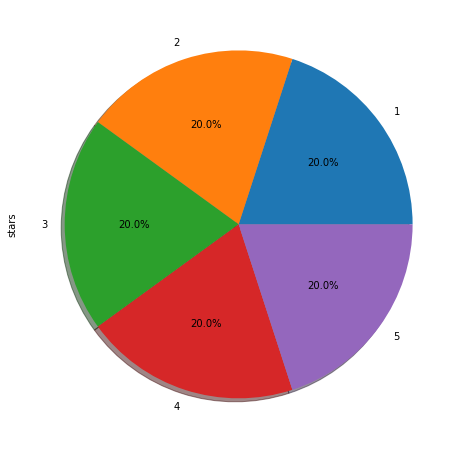

In [8]:
stars_columns.value_counts().plot(kind="pie", figsize=(10, 8), autopct="%1.1f%%", shadow=True)

## 1.2 Distribution de la longueur (nombre de mots) des avis clients

In [9]:
dataset_df["length"] = dataset_df["text"].apply(lambda x: len(x.split()))
dataset_df

,text,stars,length
0,I've only had food from here once and it wasn'...,1,68
1,I will never return here again. Ever. I was ...,1,87
2,I wish my experience was great as others. I di...,1,166
3,Are the rosemary grapefruit scones supposed to...,1,81
4,Our takeout order was half wrong. Food was mis...,1,32
...,...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5,75
24996,Stopped here for a bite while wandering around...,5,55
24997,"A quiet place with excellent food, great music...",5,32
24998,Super delicious food. Awesome vibe. I suffered...,5,41


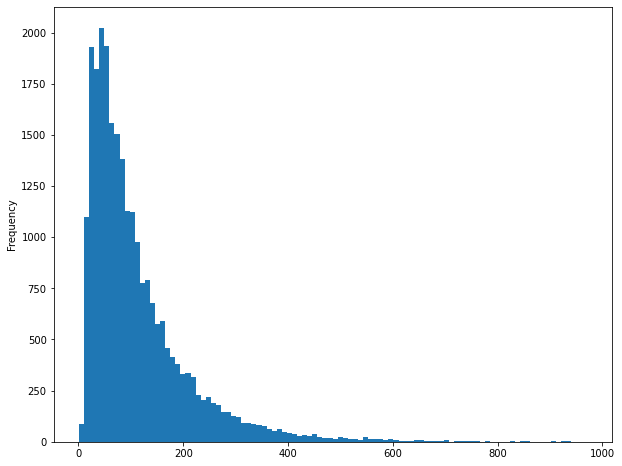

In [10]:
dataset_df.length.plot(kind="hist", bins=100, figsize=(10, 8))

## 1.3 Distribution de la longueur des avis clients en fonction du nombre d'étoiles des avis

Text(0.5, 1.0, "Répartition des longueurs des avis en fonction du nombre d'étoiles")

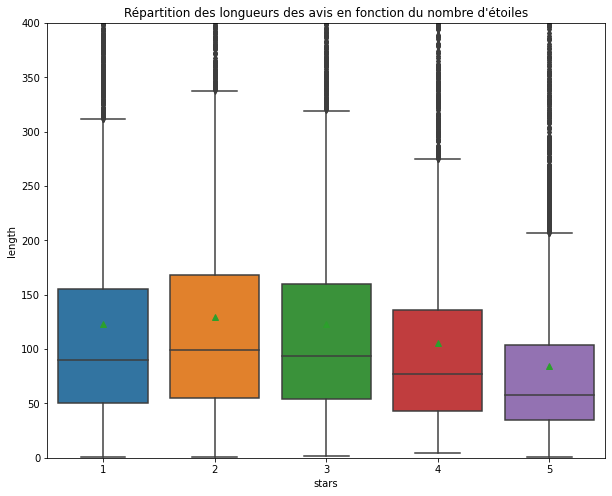

In [11]:
plt.figure(figsize=(10, 8))

ax = sns.boxplot(x=dataset_df.stars ,
            y=dataset_df.length,
            showmeans=True,
            )
ax.set_ylim(0, 400)

ax.set_title("Répartition des longueurs des avis en fonction du nombre d'étoiles")

# 2. Pré-traitement du jeu de données

In [12]:
#contraction
import contractions
for i in range(len(dataset_df)) :
    x= contractions.fix(dataset_df.text[i])
    print(x)
    dataset_df.text[i]=x
dataset_df

I have only had food from here once and it was not memorable. I had Panang curry and the balance in flavor was not there. I like to taste the coconut, lemongrass, and lime, but it was lacking in East Asia's offering. It was way too sweet. I do not care if the owners are not Thai, I will eat anything if it is cooked well, but this place should not claim to serve Thai food.
I will never return here again.  Ever.  I was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room.  After immediately getting up to leave, I informed the front desk of this issue and they blew it off as if it was nothing!  They said, oh ya, we have a mouse problem as if it was no big deal.  I will certainly be reporting this to the department of health- that is disgusting!
I wish my experience was great as others. I dined in on a Wednesday night over a week ago and to say the least our meals were horrible. I had the jerk chicken entree and my date

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.

The entrees automatically come with side dishes. It was creamed spinach and mashed potatoes. The mashed potatoes were typical, nothing extraordinary...but very BUTTERY. The creamed spinach tasted like something you could get at a local Chili's restaurant or something of that sort...overly salty. Note: these side dishes are SHARED; you do not get your own plate of it or anything.

Finally, for dessert I got the creme brulee (a taste of heaven! ahhh!) and my boyfriend got the pear sorbet (tasted like real pears...except cold and melts easily). By this point I did not really care to look at the usual prices were but I image it is somewhat pricey just like the rest of the other items. 

TWO THUMBS UP for restaurant week and the FABULOUS view! Oh yes...another reviewer mentioned something about the long wait. I did not find that it was too long, but then again me and my bf came early to prevent this. Our reservat

,text,stars,length
0,I have only had food from here once and it was...,1,68
1,I will never return here again. Ever. I was ...,1,87
2,I wish my experience was great as others. I di...,1,166
3,Are the rosemary grapefruit scones supposed to...,1,81
4,Our takeout order was half wrong. Food was mis...,1,32
...,...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5,75
24996,Stopped here for a bite while wandering around...,5,55
24997,"A quiet place with excellent food, great music...",5,32
24998,Super delicious food. Awesome vibe. I suffered...,5,41


In [13]:
dataset_df.isnull().sum()

text      0
stars     0
length    0
dtype: int64

In [14]:
#lowering
for i in range(len(dataset_df)) :
    x= (dataset_df.text[i]).lower()
    dataset_df.text[i]=x

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [15]:
dataset_df

,text,stars,length
0,i have only had food from here once and it was...,1,68
1,i will never return here again. ever. i was ...,1,87
2,i wish my experience was great as others. i di...,1,166
3,are the rosemary grapefruit scones supposed to...,1,81
4,our takeout order was half wrong. food was mis...,1,32
...,...,...,...
24995,i was a loyal fan of aroy before the ownership...,5,75
24996,stopped here for a bite while wandering around...,5,55
24997,"a quiet place with excellent food, great music...",5,32
24998,super delicious food. awesome vibe. i suffered...,5,41


In [16]:
#Removing of stop words
import nltk
from nltk.tokenize import TreebankWordTokenizer
nltk.download('stopwords')
stop_words=nltk.corpus.stopwords.words('english')

## Tokenization du texte et élemination de stopwords
def token_stopwords(sentence):
    text_without_sw = []
    tokenizer=TreebankWordTokenizer()
    tokens = tokenizer.tokenize(sentence)
    for word in tokens:
      #checking word is stopword or not
      if word not in stop_words:
              text_without_sw.append(word)

    # joining all tokens after removing stop words
    without_sw = ' '.join(text_without_sw)
    return without_sw
            

for i in range(len(dataset_df)) :
    x= token_stopwords(dataset_df.text[i])
    print(x)
    dataset_df.text[i]=x


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
great setting great restaurant ! wait staff hostess make feel like family always personable. menu tasty adult beverages quench hardiest thirst !
company like 2 waiter ( goes alias chad ) solid 7. maybe even 8 feeling generous lower standards. making experience full 10/10 ! cheers .
delicious ! ! went happy hour ordered mojitos based waiters recommendations , amazing. food excellent , well prepared attention details flavors. restaurant cute decorated well. waiter/host funny sweet. also well educated menu .
fresh , healthy , delicious authentic , different , superb service , nice decor , great experience
food really good . burger juicy bun buttery . staff really helpful well
lambert 's great grabbing quick lunch stocking groceries week. deli salad bar unbelievably good. everything vibrantly fresh staff extremely helpful .
great atmosphere.terrific service. industrial chic styling , good music , plenty seating. 

In [17]:
dataset_df

,text,stars,length
0,food memorable. panang curry balance flavor th...,1,68
1,never return again. ever. sitting booth waitin...,1,87
2,wish experience great others. dined wednesday ...,1,166
3,rosemary grapefruit scones supposed taste like...,1,81
4,"takeout order half wrong. food missing , porti...",1,32
...,...,...,...
24995,"loyal fan aroy ownership change , apprehensive...",5,75
24996,stopped bite wandering around faneuil hall. pl...,5,55
24997,"quiet place excellent food , great music helpf...",5,32
24998,super delicious food. awesome vibe. suffered d...,5,41


In [18]:
#Removing of Punctuations or Special Characters
from string import punctuation
def remove_punctuation(text):
  return text.translate(str.maketrans('', '', punctuation))

In [19]:

for i in range(len(dataset_df)) :
    #x= token_stopwords(dataset_df.text[i])
    punct_result = remove_punctuation(dataset_df.text[i])
    print(punct_result)
    dataset_df.text[i]=punct_result

food memorable panang curry balance flavor there like taste coconut  lemongrass  lime  lacking east asia s offering way sweet care owners thai  eat anything cooked well  place claim serve thai food 
never return again ever sitting booth waiting dinner come scurried mouse booth dining room immediately getting leave  informed front desk issue blew nothing  said  oh ya  mouse problem big deal certainly reporting department health disgusting 
wish experience great others dined wednesday night week ago say least meals horrible jerk chicken entree date seafood coconut entree presentation nice seafood coconut however date displeased  literally bite food couple bites mine messes jerk chicken  could finish it also expecting rice peas  caribbean restuarant  however served white rice drinks ok  rum punch drink fruit punch something also patties appetizer  ok date said typical frozen patties waitress apologized asked could something disappointed food  want try anything else doubt go back 
rosemary

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
great setting great restaurant  wait staff hostess make feel like family always personable menu tasty adult beverages quench hardiest thirst 
company like 2 waiter  goes alias chad  solid 7 maybe even 8 feeling generous lower standards making experience full 1010  cheers 
delicious   went happy hour ordered mojitos based waiters recommendations  amazing food excellent  well prepared attention details flavors restaurant cute decorated well waiterhost funny sweet also well educated menu 
fresh  healthy  delicious authentic  different  superb service  nice decor  great experience
food really good  burger juicy bun buttery  staff really helpful well
lambert s great grabbing quick lunch stocking groceries week deli salad bar unbelievably good everything vibrantly fresh staff extremely helpful 
great atmosphereterrific service industrial chic styling  good music  plenty seating coffee good  pastries fresh delicious

In [20]:
dataset_df

,text,stars,length
0,food memorable panang curry balance flavor the...,1,68
1,never return again ever sitting booth waiting ...,1,87
2,wish experience great others dined wednesday n...,1,166
3,rosemary grapefruit scones supposed taste like...,1,81
4,takeout order half wrong food missing portion...,1,32
...,...,...,...
24995,loyal fan aroy ownership change apprehensive ...,5,75
24996,stopped bite wandering around faneuil hall ple...,5,55
24997,quiet place excellent food great music helpfu...,5,32
24998,super delicious food awesome vibe suffered dis...,5,41


In [21]:
#Lemmatization
import nltk
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

def lemmatization(text):
  	# word tokenization
  tokenizer=TreebankWordTokenizer()
  tokens = tokenizer.tokenize(text)
  
		# lemma word
  #lemma = WordNetLemmatizer()
  for index in range(len(tokens)):
    lemma_word = wordnet_lemmatizer.lemmatize(tokens[index])
    tokens[index] = lemma_word
  return ' '.join(tokens)
    	
      
  

In [ ]:
#nltk.download("wordnet", "whatever_the_absolute_path_to_myapp_is/nltk_data/")

In [22]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
# # Download Wordnet through NLTK in python console:
#import nltk
#nltk.download('wordnet')

In [23]:
for i in range(len(dataset_df)) :
    #x= token_stopwords(dataset_df.text[i])
    lemma_result = lemmatization(dataset_df.text[i])
    print(lemma_result)
    dataset_df.text[i]=lemma_result

food memorable panang curry balance flavor there like taste coconut lemongrass lime lacking east asia s offering way sweet care owner thai eat anything cooked well place claim serve thai food
never return again ever sitting booth waiting dinner come scurried mouse booth dining room immediately getting leave informed front desk issue blew nothing said oh ya mouse problem big deal certainly reporting department health disgusting
wish experience great others dined wednesday night week ago say least meal horrible jerk chicken entree date seafood coconut entree presentation nice seafood coconut however date displeased literally bite food couple bite mine mess jerk chicken could finish it also expecting rice pea caribbean restuarant however served white rice drink ok rum punch drink fruit punch something also patty appetizer ok date said typical frozen patty waitress apologized asked could something disappointed food want try anything else doubt go back
rosemary grapefruit scone supposed tas

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
great setting great restaurant wait staff hostess make feel like family always personable menu tasty adult beverage quench hardiest thirst
company like 2 waiter go alias chad solid 7 maybe even 8 feeling generous lower standard making experience full 1010 cheer
delicious went happy hour ordered mojitos based waiter recommendation amazing food excellent well prepared attention detail flavor restaurant cute decorated well waiterhost funny sweet also well educated menu
fresh healthy delicious authentic different superb service nice decor great experience
food really good burger juicy bun buttery staff really helpful well
lambert s great grabbing quick lunch stocking grocery week deli salad bar unbelievably good everything vibrantly fresh staff extremely helpful
great atmosphereterrific service industrial chic styling good music plenty seating coffee good pastry fresh delicious stop whenever visit brighton
anothe

In [24]:
dataset_df


,text,stars,length
0,food memorable panang curry balance flavor the...,1,68
1,never return again ever sitting booth waiting ...,1,87
2,wish experience great others dined wednesday n...,1,166
3,rosemary grapefruit scone supposed taste like ...,1,81
4,takeout order half wrong food missing portion ...,1,32
...,...,...,...
24995,loyal fan aroy ownership change apprehensive v...,5,75
24996,stopped bite wandering around faneuil hall ple...,5,55
24997,quiet place excellent food great music helpful...,5,32
24998,super delicious food awesome vibe suffered dis...,5,41


In [25]:
pip install num2words

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 125 kB 5.4 MB/s 
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13723 sha256=8d59ea3348fe6dd2c59274d119a57cc1ec4322eea5c9b911859e8aa92f4a8d11
  Stored in directory: /root/.cache/pip/wheels/72/b0/3f/1d95f96ff986c7dfffe46ce2be4062f38ebd04b506c77c81b9
Successfully built docopt


In [26]:
from num2words import num2words
def num_to_words(text):
  after_spliting = text.split()
  for index in range(len(after_spliting)):
    if after_spliting[index].isdigit():
      after_spliting[index] = num2words(after_spliting[index])
   # joining list into string with space
  numbers_to_words = ' '.join(after_spliting)
  return numbers_to_words    


  # splitting text into words with space
	
 

In [27]:
for i in range(len(dataset_df)) :
    numners_result = num_to_words(dataset_df.text[i])
    print(numners_result)
    dataset_df.text[i]=numners_result

food memorable panang curry balance flavor there like taste coconut lemongrass lime lacking east asia s offering way sweet care owner thai eat anything cooked well place claim serve thai food
never return again ever sitting booth waiting dinner come scurried mouse booth dining room immediately getting leave informed front desk issue blew nothing said oh ya mouse problem big deal certainly reporting department health disgusting
wish experience great others dined wednesday night week ago say least meal horrible jerk chicken entree date seafood coconut entree presentation nice seafood coconut however date displeased literally bite food couple bite mine mess jerk chicken could finish it also expecting rice pea caribbean restuarant however served white rice drink ok rum punch drink fruit punch something also patty appetizer ok date said typical frozen patty waitress apologized asked could something disappointed food want try anything else doubt go back
rosemary grapefruit scone supposed tas

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
great setting great restaurant wait staff hostess make feel like family always personable menu tasty adult beverage quench hardiest thirst
company like two waiter go alias chad solid seven maybe even eight feeling generous lower standard making experience full one thousand and ten cheer
delicious went happy hour ordered mojitos based waiter recommendation amazing food excellent well prepared attention detail flavor restaurant cute decorated well waiterhost funny sweet also well educated menu
fresh healthy delicious authentic different superb service nice decor great experience
food really good burger juicy bun buttery staff really helpful well
lambert s great grabbing quick lunch stocking grocery week deli salad bar unbelievably good everything vibrantly fresh staff extremely helpful
great atmosphereterrific service industrial chic styling good music plenty seating coffee good pastry fresh delicious stop when

In [28]:
# Creation of neative token 
def tag_words(sentence):
    import re
    # up to punctuation as in punct, put tags for words
    # following a negative word
    # find punctuation in the sentence
    punct = re.findall(r'[.:;!?]',sentence)[0]
    # create word set from sentence
    wordSet = { x for x in re.split("[.:;!?, ]",sentence) if x }
    keywordSet = {"don't","never", "nothing", "nowhere", "noone", "none", "not",
                  "hasn't","hadn't","can't","couldn't","shouldn't","won't",
                  "wouldn't","don't","doesn't","didn't","isn't","aren't","ain't"}
   
    # find negative words in sentence
    neg_words = wordSet & keywordSet
    if neg_words:
        for word in neg_words:
            start_to_w = sentence[:sentence.find(word)+len(word)]
            # put tags to words after the negative word
            w_to_punct =  re.sub(r'\b([A-Za-z\']+)\b',r'\1__not',
                               sentence[sentence.find(word)+len(word):sentence.find(punct)])
            punct_to_end = sentence[sentence.find(punct):]
            return(start_to_w + w_to_punct + punct_to_end)
    else :
        return(sentence)
  

In [30]:
for i in range(len(dataset_df)) :
    x= tag_words(dataset_df.text[i])
    print(x)
    dataset_df.text[i]=x


IndexError: ignored

In [31]:
dataset_df

,text,stars,length
0,food memorable panang curry balance flavor the...,1,68
1,never return again ever sitting booth waiting ...,1,87
2,wish experience great others dined wednesday n...,1,166
3,rosemary grapefruit scone supposed taste like ...,1,81
4,takeout order half wrong food missing portion ...,1,32
...,...,...,...
24995,loyal fan aroy ownership change apprehensive v...,5,75
24996,stopped bite wandering around faneuil hall ple...,5,55
24997,quiet place excellent food great music helpful...,5,32
24998,super delicious food awesome vibe suffered dis...,5,41


In [32]:
#The Most four Frequent Words 
from collections import Counter
for i in range(len(dataset_df)) :
  split_it = dataset_df.text[i].split()
  # Pass the split_it list to instance of Counter class.
  CounterVar = Counter(split_it)
  # most_common() produces k frequently encountered
  # input values and their respective counts.
  most_occur = CounterVar.most_common(4)
  print(most_occur)

  

  



Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[('great', 2), ('setting', 1), ('restaurant', 1), ('wait', 1)]
[('company', 1), ('like', 1), ('two', 1), ('waiter', 1)]
[('well', 3), ('delicious', 1), ('went', 1), ('happy', 1)]
[('fresh', 1), ('healthy', 1), ('delicious', 1), ('authentic', 1)]
[('really', 2), ('food', 1), ('good', 1), ('burger', 1)]
[('lambert', 1), ('s', 1), ('great', 1), ('grabbing', 1)]
[('good', 2), ('great', 1), ('atmosphereterrific', 1), ('service', 1)]
[('great', 3), ('ramen', 3), ('another', 1), ('option', 1)]
[('time', 2), ('jelly', 1), ('fish', 1), ('food', 1)]
[('pizza', 4), ('home', 3), ('slice', 3), ('white', 2)]
[('zucchini', 2), ('come', 2), ('came', 1), ('chance', 1)]
[('braised', 5), ('beef', 5), ('dish', 4), ('good', 4)]
[('salmon', 2), ('also', 2), ('friendly', 2), ('couple', 1)]
[('grilled', 2), ('good', 1), ('late', 1), ('night', 1)]
[('pizza', 5), ('hot', 3), ('slice', 3), ('cheap', 2)]
[('really', 2), ('great', 1), ('

In [33]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [34]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
#LemmatizationWithPOSTagger
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet

#text = 'What can I say about this place. The staff of these restaurants is nice and the eggplant is not bad'

class Splitter(object):
    """
    split the document into sentences and tokenize each sentence
    """
    def __init__(self):
        self.splitter = nltk.data.load('tokenizers/punkt/english.pickle')
        self.tokenizer = nltk.tokenize.TreebankWordTokenizer()

    def split(self,text):
        """
        out : ['What', 'can', 'I', 'say', 'about', 'this', 'place', '.']
        """
        # split into single sentence
        sentences = self.splitter.tokenize(text)
        # tokenization in each sentences
        tokens = [self.tokenizer.tokenize(sent) for sent in sentences]
        return tokens

class LemmatizationWithPOSTagger(object):
    def __init__(self):
        pass
    def get_wordnet_pos(self,treebank_tag):
        """
        return WORDNET POS compliance to WORDENT lemmatization (a,n,r,v) 
        """
        if treebank_tag.startswith('J'):
            return wordnet.ADJ
        elif treebank_tag.startswith('V'):
            return wordnet.VERB
        elif treebank_tag.startswith('N'):
            return wordnet.NOUN
        elif treebank_tag.startswith('R'):
            return wordnet.ADV
        else:
            # As default pos in lemmatization is Noun
            return wordnet.NOUN

    def pos_tag(self,tokens):
        # find the pos tagginf for each tokens [('What', 'WP'), ('can', 'MD'), ('I', 'PRP') ....
        pos_tokens = [nltk.pos_tag(token) for token in tokens]

        # lemmatization using pos tagg   
        # convert into feature set of [('What', 'What', ['WP']), ('can', 'can', ['MD']), ... ie [original WORD, Lemmatized word, POS tag]
        pos_tokens = [ [(word, lemmatizer.lemmatize(word,self.get_wordnet_pos(pos_tag)), [pos_tag]) for (word,pos_tag) in pos] for pos in pos_tokens]
        return pos_tokens

lemmatizer = WordNetLemmatizer()
splitter = Splitter()
lemmatization_using_pos_tagger = LemmatizationWithPOSTagger()

#step 1 split document into sentence followed by tokenization
#tokens = splitter.split(text)
for i in range(len(dataset_df)) :
  tokens = splitter.split(dataset_df.text[i])
  #step 2 lemmatization using pos tagger 
  lemma_pos_token = lemmatization_using_pos_tagger.pos_tag(tokens)
  print(lemma_pos_token)




Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[[('one', 'one', ['CD']), ('problem', 'problem', ['NN']), ('area', 'area', ['NN']), ('food', 'food', ['NN']), ('choice', 'choice', ['NN']), ('basically', 'basically', ['RB']), ('boil', 'boil', ['VBD']), ('following', 'follow', ['VBG']), ('pizzadeli', 'pizzadeli', ['JJ']), ('soso', 'soso', ['JJ']), ('chinese', 'chinese', ['JJ']), ('unfortunately', 'unfortunately', ['RB']), ('latter', 'latter', ['JJ']), ('although', 'although', ['IN']), ('service', 'service', ['NN']), ('generally', 'generally', ['RB']), ('good', 'good', ['JJ']), ('friendly', 'friendly', ['RB']), ('food', 'food', ['NN']), ('generous', 'generous', ['JJ']), ('portion', 'portion', ['NN']), ('tasty', 'tasty', ['NN'])]]
[[('extremely', 'extremely', ['RB']), ('upset', 'upset', ['JJ']), ('service', 'service', ['NN']), ('friend', 'friend', ['NN']), ('received', 'receive', ['VBD']), ('dining', 'din', ['VBG']), ('in', 'in', ['IN']), ('called', 'call', ['V

In [60]:
# Positive and negative dataframes

Negative_data= dataset_df[(dataset_df['stars'] == 1) | (dataset_df['stars'] == 2)]

Positive_data = dataset_df[(dataset_df['stars'] == 4) | (dataset_df['stars'] == 5)]

Positive_dataFrame = pd.DataFrame(columns=['text','stars','length'])

Positive_dataFrame.text= Positive_data.text
Positive_dataFrame.stars= Positive_data.stars
Positive_dataFrame.length= Positive_data.length
Positive_dataFrame.index=range(len(Positive_data))

print(Negative_data)
print(Positive_dataFrame)



                                                   text  stars  length
0     food memorable panang curry balance flavor the...      1      68
1     never return again ever sitting booth waiting ...      1      87
2     wish experience great others dined wednesday n...      1     166
3     rosemary grapefruit scone supposed taste like ...      1      81
4     takeout order half wrong food missing portion ...      1      32
...                                                 ...    ...     ...
9995  never order hot pot here much vegetable enough...      2      17
9996  work bmc heard new place opening coworker deci...      2     253
9997  went dinner drink good food could gave better ...      2     150
9998  food mediocre horrible great sausage brisket p...      2      64
9999  second time think food decent first time came ...      2      52

[10000 rows x 3 columns]
                                                   text  stars  length
0     went brunch recently appreciated self serve c

In [75]:
# having a datafarme containing equivalent positive and negative data

Pos_and_Neg_data = dataset_df[(dataset_df['stars'] == 1) | (dataset_df['stars'] == 2) | (dataset_df['stars'] == 4) | (dataset_df['stars'] == 5)]

Pos_and_Neg_DF = pd.DataFrame(columns=['text','stars','length'])

Pos_and_Neg_DF.text= Pos_and_Neg_data.text
Pos_and_Neg_DF.stars= Pos_and_Neg_data.stars
Pos_and_Neg_DF.length= Pos_and_Neg_data.length
Pos_and_Neg_DF.index=range(len(Pos_and_Neg_data))

print(Pos_and_Neg_DF)

                                                    text  stars  length
0      food memorable panang curry balance flavor the...      1      68
1      never return again ever sitting booth waiting ...      1      87
2      wish experience great others dined wednesday n...      1     166
3      rosemary grapefruit scone supposed taste like ...      1      81
4      takeout order half wrong food missing portion ...      1      32
...                                                  ...    ...     ...
19995  loyal fan aroy ownership change apprehensive v...      5      75
19996  stopped bite wandering around faneuil hall ple...      5      55
19997  quiet place excellent food great music helpful...      5      32
19998  super delicious food awesome vibe suffered dis...      5      41
19999  lot dietary restriction place spot superfood s...      5      87

[20000 rows x 3 columns]


In [76]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder

In [77]:
#split the data into training and testing datasets
x = Pos_and_Neg_DF.text.values
y = Pos_and_Neg_DF.stars.values
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=32)

In [78]:
#Vectorizing
vectorizer = CountVectorizer()
vectorizer.fit(x_train)

X_train = vectorizer.transform(x_train)
X_test = vectorizer.transform(x_test)

In [79]:
#printing the first tweet both as it was and after vectorizing it.
print(x_train[0], '\n', X_train[0])

visiting friend portland last weekend went dinner drink blue hour pearl hot spot portlandi looking forward it sat down ignored wait staff twenty minute made bringing u complimentary glass sparking rose fondue dish supposed amazing bar menuwe wanted appetizer told chef serve bar menu main part restaurant what pressed waiter said verbatim become five star chef open five million dollar restaurant choose serve want happensthis here invited guest would walked without glance backinstead ordered dinner food alrightnot five star good price way high entree menu thirty perhaps spoiled since live sf fabulous restaurant inventive menu reasonable price good service best portland offer would rather starve 
   (0, 1235)	1
  (0, 1282)	1
  (0, 1617)	1
  (0, 2262)	1
  (0, 2434)	2
  (0, 2691)	1
  (0, 2906)	1
  (0, 3278)	1
  (0, 3755)	1
  (0, 4999)	2
  (0, 5228)	1
  (0, 5921)	1
  (0, 7788)	2
  (0, 7928)	1
  (0, 8174)	1
  (0, 8323)	1
  (0, 8427)	1
  (0, 9123)	1
  (0, 9673)	1
  (0, 10177)	3
  (0, 10462)	1
 

In [83]:
##import re

# delimiters https://stackoverflow.com/questions/35221535/python-removing-delimiters-from-strings
##d = ",.!?/&-:;@'..."
##"["+"\\".join(d)+"]"

# clean up the string
##s = x_train[0]
##s = ' '.join(w for w in re.split("["+"\\".join(d)+"]", s) if w)

##for i in s.split():
  ##if len(i)>1: print(i, vectorizer.vocabulary_[i.lower()])

In [84]:
#Modelling
#Logistic Regression.

classifier = LogisticRegression(max_iter=20000)
classifier.fit(X_train, y_train)

score = classifier.score(X_test, y_test)

print("Accuracy:", score)

Accuracy: 0.62225


In [86]:
#Confussion matrix
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred, labels=Pos_and_Neg_DF.stars.unique())
df_cm = pd.DataFrame(cm, index=Pos_and_Neg_DF.stars.unique(), columns=Pos_and_Neg_DF.stars.unique())
df_cm

,1,2,4,5
1,671,290,18,20
2,278,598,97,45
4,23,84,546,325
5,13,36,282,674


In [87]:
#For a better understanding we could use percentage expression.
df_cm_percentage = df_cm.copy()
for i in df_cm_percentage:
  df_cm_percentage[i]/=df_cm_percentage[i].sum()

df_cm_percentage

,1,2,4,5
1,0.681218,0.287698,0.019088,0.018797
2,0.282234,0.593254,0.102863,0.042293
4,0.023350,0.083333,0.579003,0.305451
5,0.013198,0.035714,0.299046,0.633459


In [94]:
#Test 
#Let's just make sure our model works okay with positive and negative sentiments.
for i in range(len(Pos_and_Neg_DF)) :
  vectTweet = vectorizer.transform(np.array([Pos_and_Neg_DF.text[i]]))  # vectorizes the tweet using our vectorizer
  prediction = classifier.predict(vectTweet)  # predicts class of the tweet
  print(i,' ',Pos_and_Neg_DF.text[i],' | number of stars :',Pos_and_Neg_DF.stars[i],'| Tweet is', 'positive' if (prediction[0]==4) | (prediction[0]==5) else 'negative')
  







Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
15000   great setting great restaurant wait staff hostess make feel like family always personable menu tasty adult beverage quench hardiest thirst  | Stars number : 5 | Tweet is positive
15001   company like two waiter go alias chad solid seven maybe even eight feeling generous lower standard making experience full one thousand and ten cheer  | Stars number : 5 | Tweet is positive
15002   delicious went happy hour ordered mojitos based waiter recommendation amazing food excellent well prepared attention detail flavor restaurant cute decorated well waiterhost funny sweet also well educated menu  | Stars number : 5 | Tweet is positive
15003   fresh healthy delicious authentic different superb service nice decor great experience  | Stars number : 5 | Tweet is positive
15004   food really good burger juicy bun buttery staff really helpful well  | Stars number : 5 | Tweet is positive
15005   lambert s great grabbi

In [90]:
#Let's just make sure our model works okay with negative sentiments.
#Test 
for i in range(len(Negative_data)) :
  vectTweet = vectorizer.transform(np.array([Negative_data.text[i]]))  # vectorizes the tweet using our vectorizer
  prediction = classifier.predict(vectTweet)  # predicts class of the tweet
  print(i,'| number of stars :',Negative_data.stars[i],'| Tweet is', 'positive' if (prediction[0]==4) | (prediction[0]==5) else 'negative')

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
5000 | Stars number : 2 | Tweet is negative
5001 | Stars number : 2 | Tweet is negative
5002 | Stars number : 2 | Tweet is negative
5003 | Stars number : 2 | Tweet is negative
5004 | Stars number : 2 | Tweet is negative
5005 | Stars number : 2 | Tweet is negative
5006 | Stars number : 2 | Tweet is negative
5007 | Stars number : 2 | Tweet is negative
5008 | Stars number : 2 | Tweet is negative
5009 | Stars number : 2 | Tweet is negative
5010 | Stars number : 2 | Tweet is negative
5011 | Stars number : 2 | Tweet is negative
5012 | Stars number : 2 | Tweet is positive
5013 | Stars number : 2 | Tweet is positive
5014 | Stars number : 2 | Tweet is negative
5015 | Stars number : 2 | Tweet is negative
5016 | Stars number : 2 | Tweet is negative
5017 | Stars number : 2 | Tweet is negative
5018 | Stars number : 2 | Tweet is negative
5019 | Stars number : 2 | Tweet is negative
5020 | Stars number : 2 | Tweet is negativ

In [91]:
#Let's just make sure our model works okay with positive sentiments.
#Test
for i in range(len(Positive_dataFrame)) :
  vectTweet = vectorizer.transform(np.array([Positive_dataFrame.text[i]]))  # vectorizes the tweet using our vectorizer
  prediction = classifier.predict(vectTweet)  # predicts class of the tweet
  print(i,' | number of stars :',Positive_dataFrame.stars[i],'| Tweet is', 'positive' if (prediction[0]==4) | (prediction[0]==5) else 'negative')

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
5000  | Stars number : 5 | Tweet is positive
5001  | Stars number : 5 | Tweet is positive
5002  | Stars number : 5 | Tweet is positive
5003  | Stars number : 5 | Tweet is positive
5004  | Stars number : 5 | Tweet is positive
5005  | Stars number : 5 | Tweet is positive
5006  | Stars number : 5 | Tweet is positive
5007  | Stars number : 5 | Tweet is positive
5008  | Stars number : 5 | Tweet is positive
5009  | Stars number : 5 | Tweet is positive
5010  | Stars number : 5 | Tweet is positive
5011  | Stars number : 5 | Tweet is positive
5012  | Stars number : 5 | Tweet is positive
5013  | Stars number : 5 | Tweet is positive
5014  | Stars number : 5 | Tweet is positive
5015  | Stars number : 5 | Tweet is positive
5016  | Stars number : 5 | Tweet is positive
5017  | Stars number : 5 | Tweet is positive
5018  | Stars number : 5 | Tweet is positive
5019  | Stars number : 5 | Tweet is positive
5020  | Stars number :

In [95]:
Pos_and_Neg_DF.to_csv("fileData_Output.csv")